# MATH 3423: Unconstrained Optimization
Unconstrained optimization concerns itself with the following minimization problem:

$$
\min_{x\in\mathbb{R}^n}f(x),
$$

where $f:\mathbb{R}^n \rightarrow \mathbb{R}$ is a smooth function. Some examples are linear and non-linear least sqaures, logistic regression, and training deep neural networks. In this notebook we explore the fundamental notion of search direction and step length, as illustrated by line search methods. 

## Line Search Methods
Line search methods are a subclass of iterative methods, where from an initial guess $x_0$, a search direction $p_k$ and step length $\alpha_k$ are computed at each iteration in order to update the current possible solution. 

$$
x_{k+1} = x_{k} + \alpha_{k}p_{k}. 
$$

Most line search methods require $p_{k}$ to be a descent direction - one for which $p_{k}^{T}\nabla f_{k} < 0$. Commonly, the search direction has the form:

$$
    p_{k} = -B_{k}^{-1}\nabla f_{k},
$$

where $B_{k}$ is a symmetric nonsingular matrix. The two most popular choices for the search direction are:

* $B_{k} = I \rightarrow $ Gradient Descent Method 


* $B_{k} = \nabla^{2}f(x_{k}) \rightarrow $ Newtons Method 

### Gradient Descent 
Gradient descent is one of the most common optimization methods used in deep learning, and is essential for those interested in modern machine learning. We will illustrate the gradient descent method by applying it to the following example function.

$$
f(x, y) = \frac{1}{40}(y-x^{2})^{2} + (1 - x)^{2}.
$$

For steepest descent, we initialize $x_0$ equal to some value in $\mathbb{R}^n$, and then update according to:

$$
x_{k+1} = x_{k} - \alpha_{k}\nabla f(x_{k}).
$$

The professional mathematician would seek to optimize the choice of $\alpha_{k}$ at each iteration. For our purposes, we will simply experiment with different values. 

In [1]:
using Plots, LinearAlgebra
theme(:dark)

In [2]:
# Define the function f(x,y)
f(x, y) = (1/40)*(y - x^2)^2 + (1 - x)^2

# Explicitly define the gradient
∇f(x,y) = [-(x/10.0)*(y-x^2) - (1.0-x), (1/20)*(y-x^2)]

# Define the steepest descent method
function steepest_descent_method(f, x, y, α, ϵ)    
    points = [(x,y)]
    count = 0
    while norm(∇f(x, y)) > ϵ
        x, y = points[end][1], points[end][2]
        xk = [x,y] - α*∇f(x,y)
        push!(points, (xk[1], xk[2]))
        count += 1
    end
    println("Iteration count: $count \n")
    return points
end

steepest_descent_method (generic function with 1 method)

In [9]:
x = -2.0:0.019:3.5
y = -12:0.019:14
X = repeat(reshape(x, 1, :), length(y), 1)
Y = repeat(y, 1, length(x))
plot(X, Y, f,
    title = "f(x,y) = (1/40)(y-x^2)^2 + (1-x)^2",
    xaxis = "x",
    yaxis = "y",
    legend = false,
    fill = true, 
    color="white")

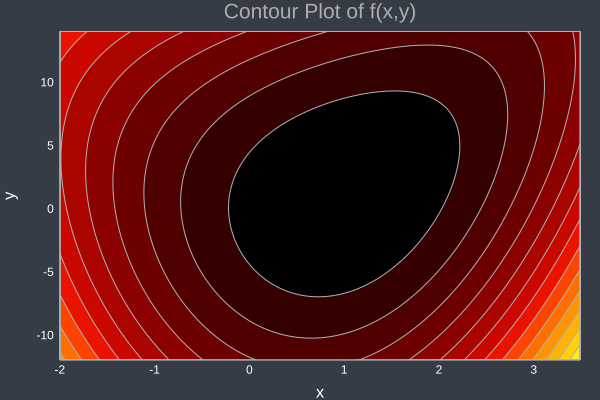

In [4]:
contour(x, y, f,
            title = "Contour Plot of f(x,y)",
            xaxis = "x",
            yaxis = "y", 
            legend = false,
            fill = true)

Iteration count: 112 



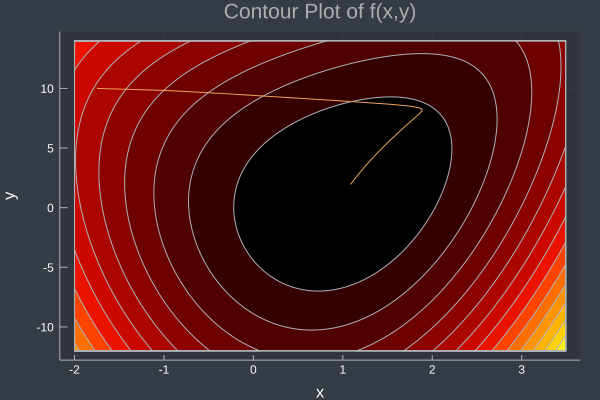

In [5]:
contour(x, y, f,
        title = "Contour Plot of f(x,y)",
        xaxis = "x",
        yaxis = "y", 
        legend = false, 
        fill = true)
p = steepest_descent_method(f, -1.75, 10.0, 0.52, 0.04)
plot!(p)

Iteration count: 47 



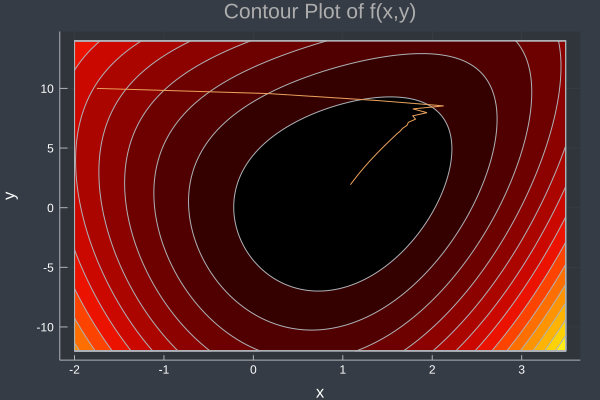

In [6]:
contour(x, y, f,
        title = "Contour Plot of f(x,y)",
        xaxis = "x",
        yaxis = "y", 
        legend = false, 
        fill = true)
p = steepest_descent_method(f, -1.75, 10.0, 1.25, 0.04)
plot!(p)

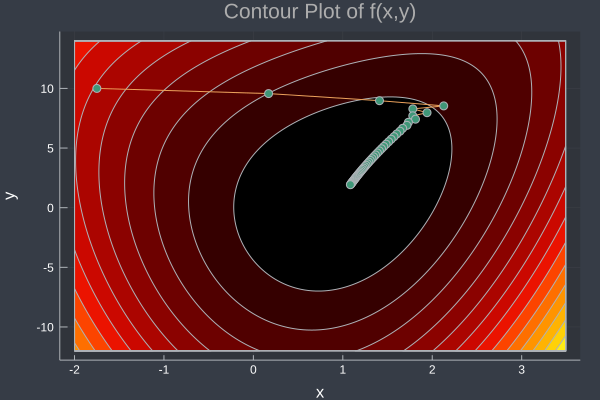

In [7]:
scatter!(p)

In [10]:
A =[4 -1 1; -1 4 1; 1 -1 4]

3×3 Array{Int64,2}:
  4  -1  1
 -1   4  1
  1  -1  4

In [11]:
det(A)

60.0

In [17]:
using LinearAlgebra
λ = eigvals(A)

3-element Array{Float64,1}:
 5.000000000000001
 3.000000000000001
 3.999999999999998

In [18]:
λ[1]*λ[2]*λ[3]

59.99999999999999

In [19]:
4*3

12